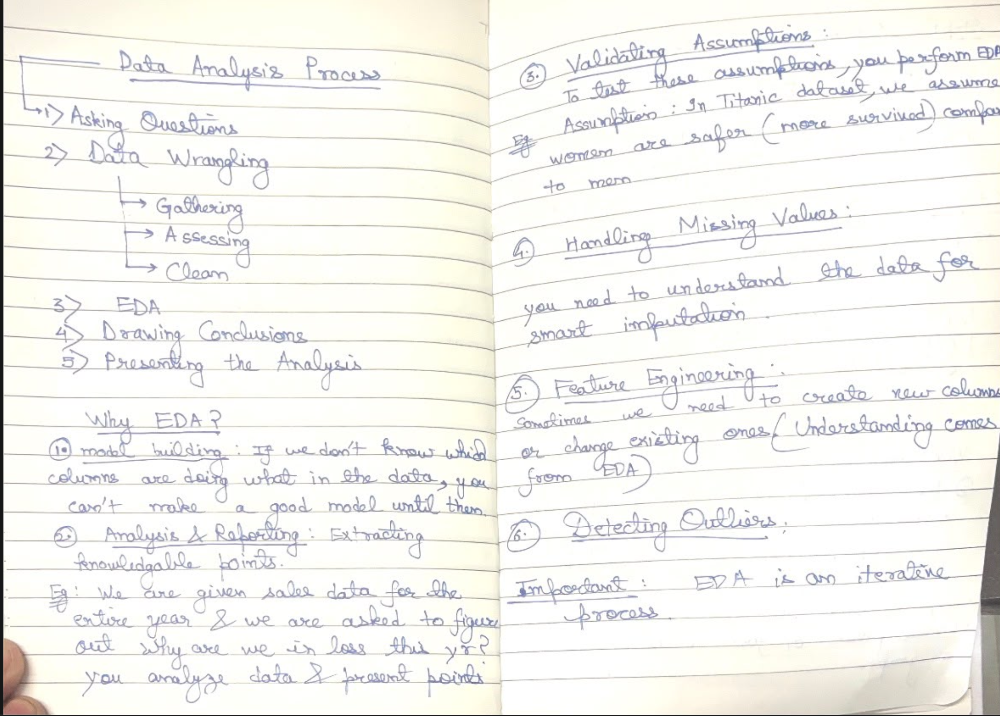

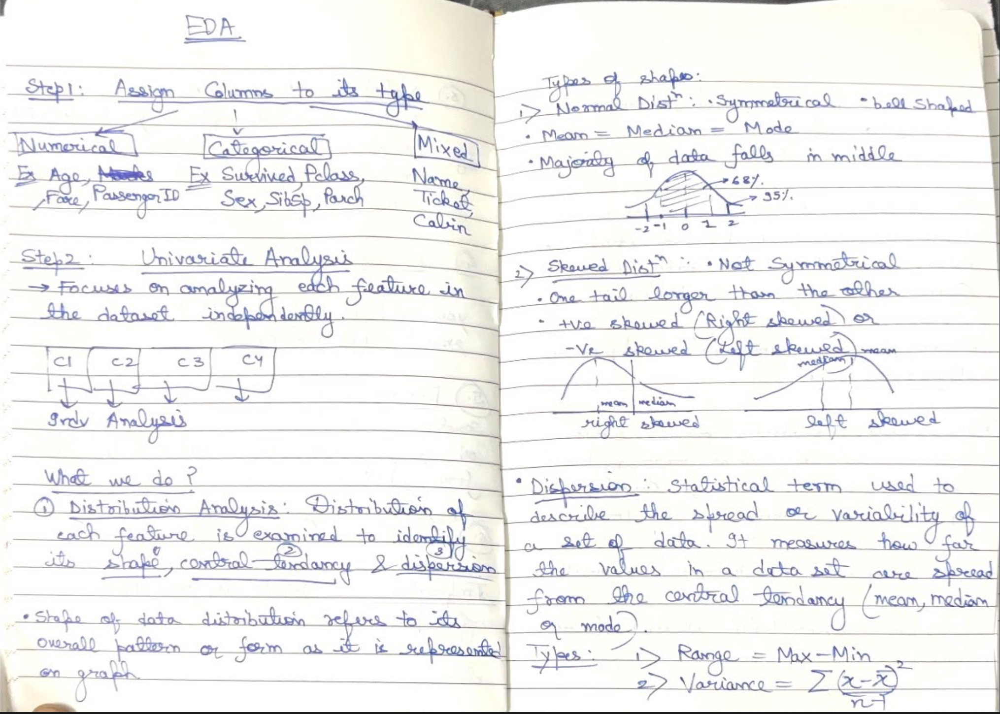

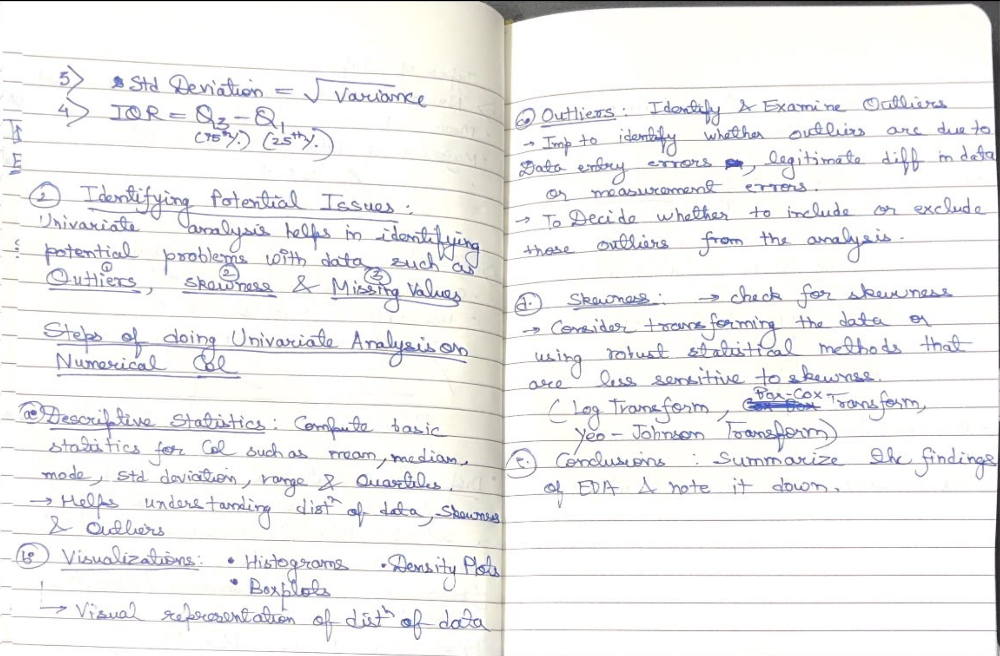

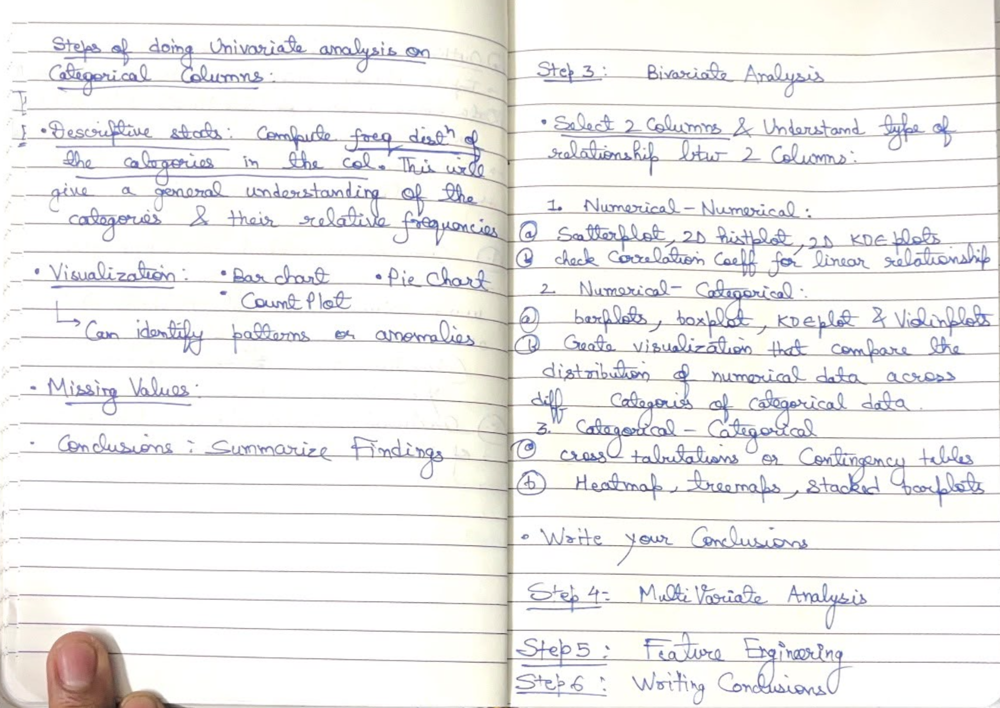

In [2]:
import pandas as pd
import numpy as np
import seaborn as sns
import scipy
import matplotlib.pyplot as plt
df=pd.read_csv('/Users/priyanshugupta/Desktop/EDA Techniques/Datasets/train.csv')


## Q1- How big is the data ?

In [3]:
df.shape

(891, 12)

## Q2-How does the data look like ?

In [4]:
df.head()

,PassengerId,Survived,Pclass,Name,Sex,Age,SibSp,Parch,Ticket,Fare,Cabin,Embarked
0,1,0,3,"Braund, Mr. Owen Harris",male,22.0,1,0,A/5 21171,7.2500,NaN,S
1,2,1,1,"Cumings, Mrs. John Bradley (Florence Briggs Th...",female,38.0,1,0,PC 17599,71.2833,C85,C
2,3,1,3,"Heikkinen, Miss. Laina",female,26.0,0,0,STON/O2. 3101282,7.9250,NaN,S
3,4,1,1,"Futrelle, Mrs. Jacques Heath (Lily May Peel)",female,35.0,1,0,113803,53.1000,C123,S
4,5,0,3,"Allen, Mr. William Henry",male,35.0,0,0,373450,8.0500,NaN,S


## Q3-Are there any missing values ?

In [5]:
df.isnull().sum()

PassengerId      0
Survived         0
Pclass           0
Name             0
Sex              0
Age            177
SibSp            0
Parch            0
Ticket           0
Fare             0
Cabin          687
Embarked         2
dtype: int64

## Q4-How does the data look mathematically ?

In [6]:
df.describe()

,PassengerId,Survived,Pclass,Age,SibSp,Parch,Fare
count,891.000000,891.000000,891.000000,714.000000,891.000000,891.000000,891.000000
mean,446.000000,0.383838,2.308642,29.699118,0.523008,0.381594,32.204208
std,257.353842,0.486592,0.836071,14.526497,1.102743,0.806057,49.693429
min,1.000000,0.000000,1.000000,0.420000,0.000000,0.000000,0.000000
25%,223.500000,0.000000,2.000000,20.125000,0.000000,0.000000,7.910400
50%,446.000000,0.000000,3.000000,28.000000,0.000000,0.000000,14.454200
75%,668.500000,1.000000,3.000000,38.000000,1.000000,0.000000,31.000000
max,891.000000,1.000000,3.000000,80.000000,8.000000,6.000000,512.329200


## Q5-Are there any duplicate values?

In [7]:
df.duplicated().sum() ## any rows which are duplicated

np.int64(0)

In [8]:
df['Pclass'].value_counts()

Pclass
3    491
1    216
2    184
Name: count, dtype: int64

In [9]:
df['SibSp'].value_counts()

SibSp
0    608
1    209
2     28
4     18
3     16
8      7
5      5
Name: count, dtype: int64

## Q6-Is there any correlation between columns?

In [10]:
## use df.corr()['Survived']

## Step 1:Column Types

In [11]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 891 entries, 0 to 890
Data columns (total 12 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   PassengerId  891 non-null    int64  
 1   Survived     891 non-null    int64  
 2   Pclass       891 non-null    int64  
 3   Name         891 non-null    object 
 4   Sex          891 non-null    object 
 5   Age          714 non-null    float64
 6   SibSp        891 non-null    int64  
 7   Parch        891 non-null    int64  
 8   Ticket       891 non-null    object 
 9   Fare         891 non-null    float64
 10  Cabin        204 non-null    object 
 11  Embarked     889 non-null    object 
dtypes: float64(2), int64(5), object(5)
memory usage: 83.7+ KB



1- Numerical: PassengerID,Age,Fare

2- Categorical: Pclass(1/2/3),Survived(0/1),Sex(M/F),SibSp(0/1/2/3/4/5/8),Parch,Embarked

3- Mixed: Name (ente saare naam hai ke category nahi ban rahi and numbers nahi hai toh numerical bhi nahi hai),Ticket,Cabin

## Step 2: Univariate Analysis (Numerical Column)

### Age

***Conclusions***

In [12]:
df['Age']

0      22.0
1      38.0
2      26.0
3      35.0
4      35.0
       ... 
886    27.0
887    19.0
888     NaN
889    26.0
890    32.0
Name: Age, Length: 891, dtype: float64

In [13]:
df['Age'].describe()

count    714.000000
mean      29.699118
std       14.526497
min        0.420000
25%       20.125000
50%       28.000000
75%       38.000000
max       80.000000
Name: Age, dtype: float64

<Axes: ylabel='Frequency'>

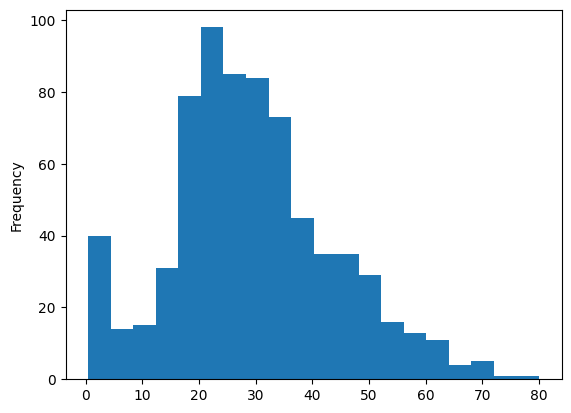

In [14]:
df['Age'].plot(kind='hist',bins=20) ## bin size=20 then 0-5,5-10,10-15,...95-100

<Axes: ylabel='Density'>

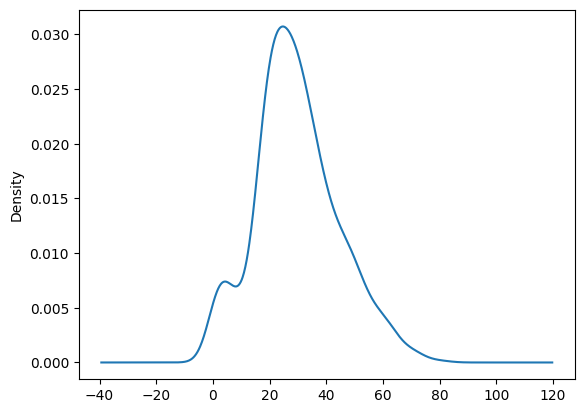

In [15]:
df['Age'].plot(kind='kde') ## bin size=20 then 0-5,5-10,10-15,...95-100

In [16]:
df['Age'].skew() ## very close to 0

np.float64(0.38910778230082704)

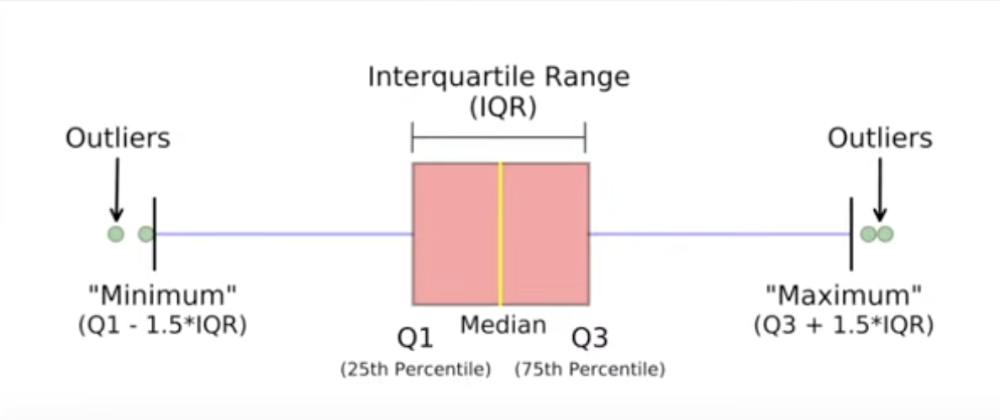

<Axes: >

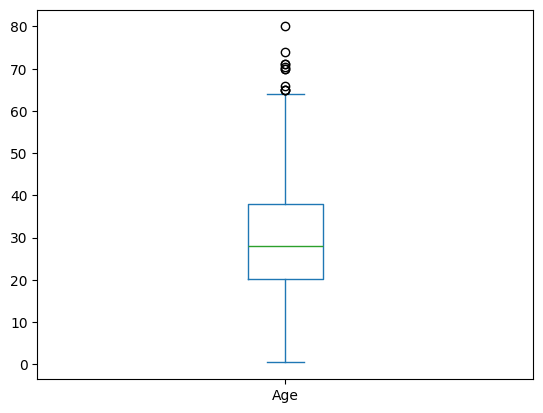

In [17]:
df['Age'].plot(kind='box')

In [18]:
## age above 65 are outliers

df[df['Age']>65]

## data is right there is not age like 300 or 200

,PassengerId,Survived,Pclass,Name,Sex,Age,SibSp,Parch,Ticket,Fare,Cabin,Embarked
33,34,0,2,"Wheadon, Mr. Edward H",male,66.0,0,0,C.A. 24579,10.5000,NaN,S
96,97,0,1,"Goldschmidt, Mr. George B",male,71.0,0,0,PC 17754,34.6542,A5,C
116,117,0,3,"Connors, Mr. Patrick",male,70.5,0,0,370369,7.7500,NaN,Q
493,494,0,1,"Artagaveytia, Mr. Ramon",male,71.0,0,0,PC 17609,49.5042,NaN,C
630,631,1,1,"Barkworth, Mr. Algernon Henry Wilson",male,80.0,0,0,27042,30.0000,A23,S
672,673,0,2,"Mitchell, Mr. Henry Michael",male,70.0,0,0,C.A. 24580,10.5000,NaN,S
745,746,0,1,"Crosby, Capt. Edward Gifford",male,70.0,1,1,WE/P 5735,71.0000,B22,S
851,852,0,3,"Svensson, Mr. Johan",male,74.0,0,0,347060,7.7750,NaN,S


In [19]:
df['Age'].isnull().sum()/len(df['Age'])

## 19% missing values 

np.float64(0.19865319865319866)

## Conclusions:

1- Age is normally(almost) distributed

2- 20% of the values are missing

3- There are some outliers but the measurements are correct. not like age=300 or something 

### Fare

***Conclusions***

In [20]:
df['Fare'].describe()

## roughly 32 dollars for one seat
## min=0 someone is travelling for free
## max=512 there is someone who is paying 512$ for travelling

count    891.000000
mean      32.204208
std       49.693429
min        0.000000
25%        7.910400
50%       14.454200
75%       31.000000
max      512.329200
Name: Fare, dtype: float64

<Axes: ylabel='Frequency'>

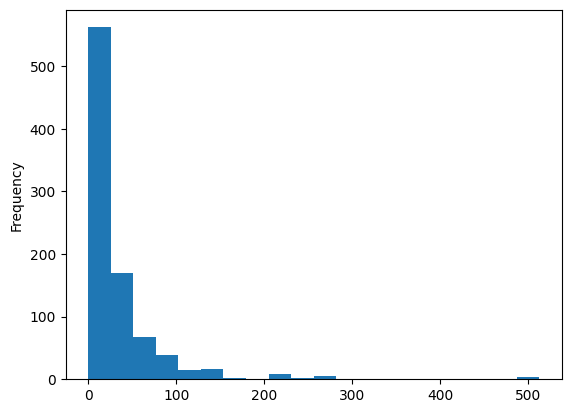

In [21]:
df['Fare'].plot(kind='hist',bins=20)
## not normally distributed

<Axes: ylabel='Density'>

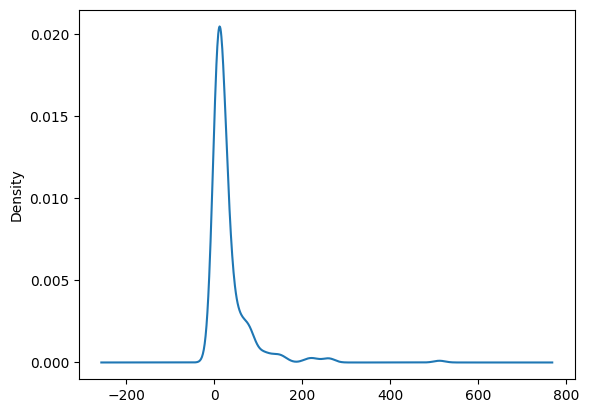

In [22]:
df['Fare'].plot(kind='kde')


In [23]:
df['Fare'].skew()
### highly positively skewed 

np.float64(4.787316519674893)

<Axes: >

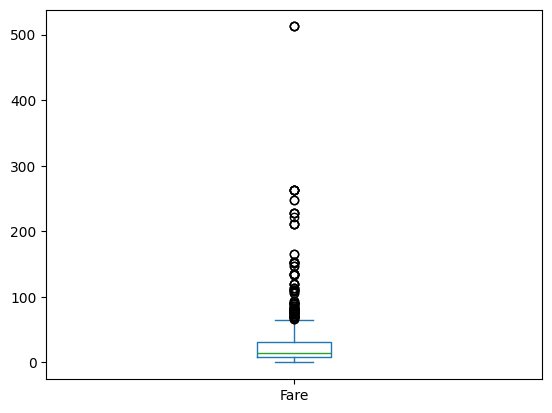

In [24]:
df['Fare'].plot(kind='box')

In [25]:
## it has many outliers

df[df['Fare']>300]

## these passengers have same ticket

,PassengerId,Survived,Pclass,Name,Sex,Age,SibSp,Parch,Ticket,Fare,Cabin,Embarked
258,259,1,1,"Ward, Miss. Anna",female,35.0,0,0,PC 17755,512.3292,NaN,C
679,680,1,1,"Cardeza, Mr. Thomas Drake Martinez",male,36.0,0,1,PC 17755,512.3292,B51 B53 B55,C
737,738,1,1,"Lesurer, Mr. Gustave J",male,35.0,0,0,PC 17755,512.3292,B101,C


In [26]:
df[df['Fare']>250]
## 263 fare ones have same ticket 

## observation: fare value given here is not fare value of individual person. If there is a family spse each person costs 20 dollars and there are 4 people 
## for each it should be 20 dollars. but it is given 80 dollars each to all 4 people

,PassengerId,Survived,Pclass,Name,Sex,Age,SibSp,Parch,Ticket,Fare,Cabin,Embarked
27,28,0,1,"Fortune, Mr. Charles Alexander",male,19.0,3,2,19950,263.0000,C23 C25 C27,S
88,89,1,1,"Fortune, Miss. Mabel Helen",female,23.0,3,2,19950,263.0000,C23 C25 C27,S
258,259,1,1,"Ward, Miss. Anna",female,35.0,0,0,PC 17755,512.3292,NaN,C
311,312,1,1,"Ryerson, Miss. Emily Borie",female,18.0,2,2,PC 17608,262.3750,B57 B59 B63 B66,C
341,342,1,1,"Fortune, Miss. Alice Elizabeth",female,24.0,3,2,19950,263.0000,C23 C25 C27,S
438,439,0,1,"Fortune, Mr. Mark",male,64.0,1,4,19950,263.0000,C23 C25 C27,S
679,680,1,1,"Cardeza, Mr. Thomas Drake Martinez",male,36.0,0,1,PC 17755,512.3292,B51 B53 B55,C
737,738,1,1,"Lesurer, Mr. Gustave J",male,35.0,0,0,PC 17755,512.3292,B101,C
742,743,1,1,"Ryerson, Miss. Susan Parker ""Suzette""",female,21.0,2,2,PC 17608,262.3750,B57 B59 B63 B66,C


In [27]:
## fare is a grouped fare

In [28]:
df['Fare'].isnull().sum()

np.int64(0)

## Conclusions

1- The data is highly skewed (+vely skewed)

2- Fare column actually contains the grouped fare and not the individual fare . This might be an issue and we need to create a new column called individual fare



## Univariate Analysis on Categorical columns

### survived

***conclusions***

In [29]:
df['Survived'].value_counts()

Survived
0    549
1    342
Name: count, dtype: int64

<Axes: xlabel='Survived'>

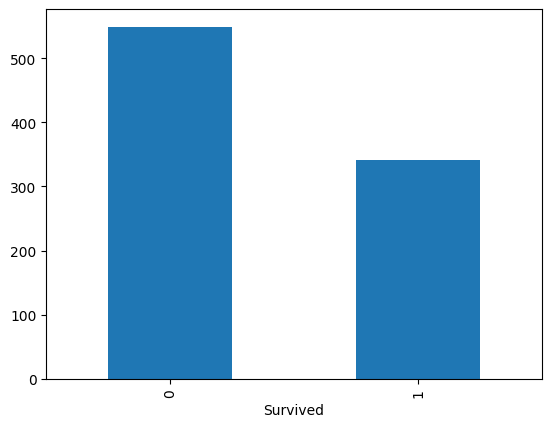

In [30]:
df['Survived'].value_counts().plot(kind='bar')

<Axes: ylabel='count'>

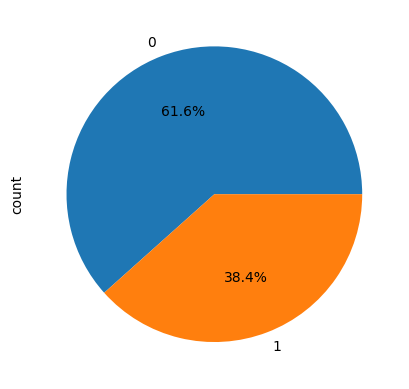

In [31]:
df['Survived'].value_counts().plot(kind='pie',autopct='%0.1f%%')

In [32]:
df['Survived'].isnull().sum()

np.int64(0)

## Conclusions

The accident was very deadly as more than 50 percent people died 

In [33]:
df['Pclass'].value_counts()

## 3 is cheapest and 1 is most expensive 

Pclass
3    491
1    216
2    184
Name: count, dtype: int64

## Conclusions:

Surprisingly less people travelled in Pclass 2 compared to Pclass 1 as Pclass 2 is cheaper

<Axes: ylabel='count'>

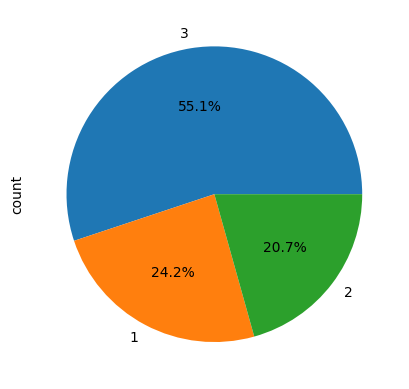

In [34]:
df['Pclass'].value_counts().plot(kind='pie',autopct='%0.1f%%')

In [35]:
df['Sex'].value_counts()

Sex
male      577
female    314
Name: count, dtype: int64

<Axes: ylabel='count'>

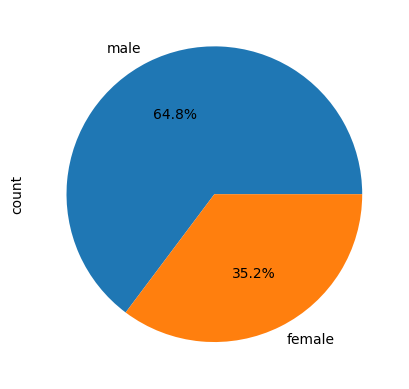

In [36]:
df['Sex'].value_counts().plot(kind='pie',autopct='%0.1f%%')

In [37]:
df['Sex'].isnull().sum()

np.int64(0)

In [38]:
df['SibSp'].value_counts()
## kitne bhai behen and husband 

SibSp
0    608
1    209
2     28
4     18
3     16
8      7
5      5
Name: count, dtype: int64

<Axes: ylabel='count'>

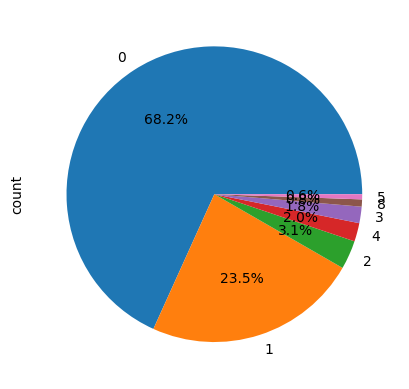

In [39]:
df['SibSp'].value_counts().plot(kind='pie',autopct='%0.1f%%')

In [40]:
df['Parch'].value_counts()
##Parent ya child

Parch
0    678
1    118
2     80
5      5
3      5
4      4
6      1
Name: count, dtype: int64

<Axes: xlabel='Parch'>

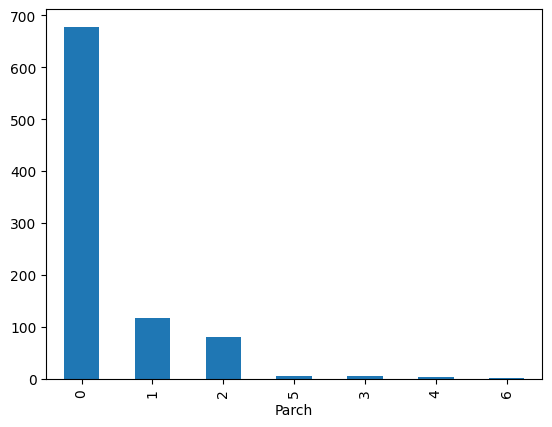

In [41]:
df['Parch'].value_counts().plot(kind='bar')

## Conclusions:

1-Parch and SibSp should be merged into one column named family_size

2- Can create new column called is_alone



In [42]:
df['Embarked'].value_counts()

Embarked
S    644
C    168
Q     77
Name: count, dtype: int64

<Axes: xlabel='Embarked'>

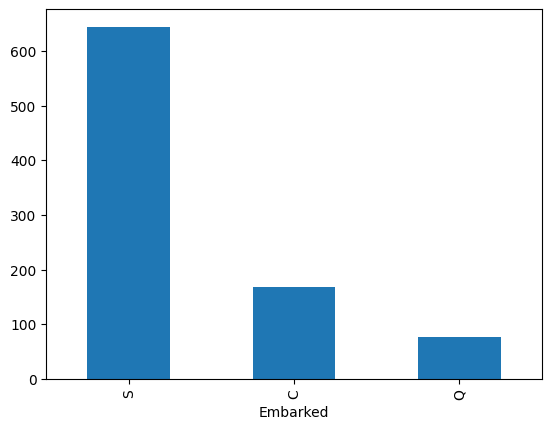

In [43]:
df['Embarked'].value_counts().plot(kind='bar')

In [44]:
## to work with mix columns, you need to do feature engineering on
# mixed columns... create new columns from those

## Step 3: Bivariate Analysis

In [45]:
## ideally you pick your most imp column (output column) and 
# find its bivariate analysis with other columns

In [46]:
## Relationship between survived and pclass:
## both are categorical
## normalize='index' or 'column' or 'all'
pd.crosstab(df['Survived'],df['Pclass'],margins=True,normalize='all')

Pclass,1,2,3,All
Survived,,,,
0,0.089787,0.108866,0.417508,0.616162
1,0.152637,0.097643,0.133558,0.383838
All,0.242424,0.206510,0.551066,1.000000


In [47]:
pd.crosstab(df['Survived'],df['Pclass'],margins=True,normalize='index')

Pclass,1,2,3
Survived,,,
0,0.145719,0.176685,0.677596
1,0.397661,0.254386,0.347953
All,0.242424,0.206510,0.551066


In [48]:
pd.crosstab(df['Survived'],df['Pclass'],margins=True,normalize='columns')

Pclass,1,2,3,All
Survived,,,,
0,0.37037,0.527174,0.757637,0.616162
1,0.62963,0.472826,0.242363,0.383838


In [49]:
pd.crosstab(df['Survived'],df['Pclass'],margins=True,normalize='columns')*100

Pclass,1,2,3,All
Survived,,,,
0,37.037037,52.717391,75.763747,61.616162
1,62.962963,47.282609,24.236253,38.383838


## Conclusions:

Pclass 3 was the most dangerous class and Pclass 1 is the safest class

Pclass 1 is the riskfree

<Axes: xlabel='Pclass', ylabel='Survived'>

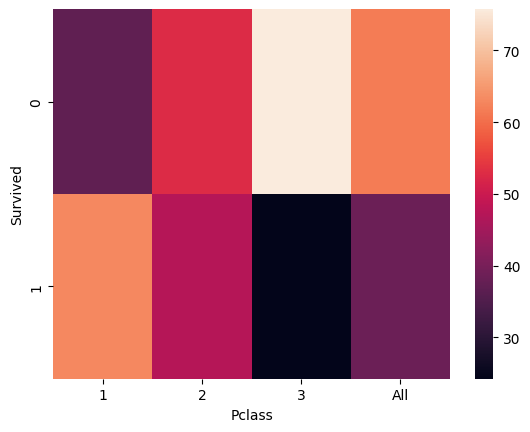

In [50]:
sns.heatmap(pd.crosstab(df['Survived'],df['Pclass'],margins=True,normalize='columns')*100)

In [51]:
pd.crosstab(df['Survived'],df['Sex'],margins=True,normalize='columns')*100

Sex,female,male,All
Survived,,,
0,25.796178,81.109185,61.616162
1,74.203822,18.890815,38.383838


## Conclusions:

Ladies first.. Guards give priority to females

In [52]:
pd.crosstab(df['Survived'],df['Embarked'],margins=True,normalize='columns')*100

Embarked,C,Q,S,All
Survived,,,,
0,44.642857,61.038961,66.304348,61.754781
1,55.357143,38.961039,33.695652,38.245219


55 percent survived who took station from S


It is possible that people who take C station might be from Pclass1 or C can have more womens

In [53]:
pd.crosstab(df['Sex'],df['Embarked'],margins=True,normalize='columns')*100

## it isn't because of gender

Embarked,C,Q,S,All
Sex,,,,
female,43.452381,46.753247,31.521739,35.095613
male,56.547619,53.246753,68.478261,64.904387


In [54]:
pd.crosstab(df['Pclass'],df['Embarked'],margins=True,normalize='columns')*100

## C is safest because people from Pclass1 took C

Embarked,C,Q,S,All
Pclass,,,,
1,50.595238,2.597403,19.720497,24.071991
2,10.119048,3.896104,25.465839,20.697413
3,39.285714,93.506494,54.813665,55.230596


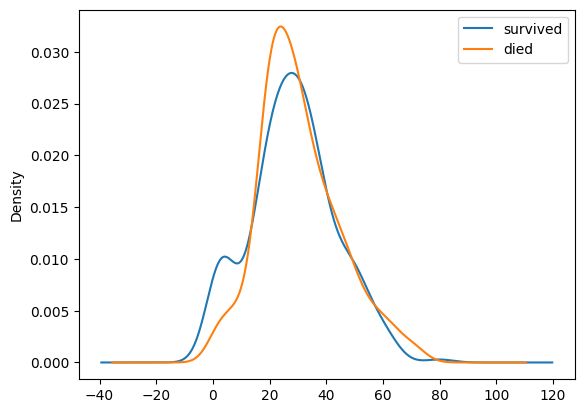

In [55]:
## we will find relationship between age and survive (numerical-categorical)

df[df['Survived']==1]['Age'].plot(kind='kde',label='survived')
df[df['Survived']==0]['Age'].plot(kind='kde',label='died')
plt.legend()
plt.show()

## Conclusions:

0-5 age of kids have higher chance of survival than dying

Kids have higher chance of survival

10-40 age of people have higher chance of dying 

Pclass1 are people who are older age

age >60 are older people and they lost their agility hence they die

In [56]:
df[df['Pclass']==1]['Age'].mean()

np.float64(38.233440860215055)

## Feature Engineering on Fare column

In [57]:
df['SibSp'].value_counts()

SibSp
0    608
1    209
2     28
4     18
3     16
8      7
5      5
Name: count, dtype: int64

In [58]:
df[df['SibSp']==8]

,PassengerId,Survived,Pclass,Name,Sex,Age,SibSp,Parch,Ticket,Fare,Cabin,Embarked
159,160,0,3,"Sage, Master. Thomas Henry",male,NaN,8,2,CA. 2343,69.55,NaN,S
180,181,0,3,"Sage, Miss. Constance Gladys",female,NaN,8,2,CA. 2343,69.55,NaN,S
201,202,0,3,"Sage, Mr. Frederick",male,NaN,8,2,CA. 2343,69.55,NaN,S
324,325,0,3,"Sage, Mr. George John Jr",male,NaN,8,2,CA. 2343,69.55,NaN,S
792,793,0,3,"Sage, Miss. Stella Anna",female,NaN,8,2,CA. 2343,69.55,NaN,S
846,847,0,3,"Sage, Mr. Douglas Bullen",male,NaN,8,2,CA. 2343,69.55,NaN,S
863,864,0,3,"Sage, Miss. Dorothy Edith ""Dolly""",female,NaN,8,2,CA. 2343,69.55,NaN,S


These all belong to one family as they all have same surname and they have same fare price

In [59]:
## to get individual fare we divide:
# fare / sum(parch and SibSp + 1(including himself))
## they all travel in Pclass3

In [60]:
69.55/11

6.322727272727272

In [61]:
df[df['Ticket']=='CA. 2343']

,PassengerId,Survived,Pclass,Name,Sex,Age,SibSp,Parch,Ticket,Fare,Cabin,Embarked
159,160,0,3,"Sage, Master. Thomas Henry",male,NaN,8,2,CA. 2343,69.55,NaN,S
180,181,0,3,"Sage, Miss. Constance Gladys",female,NaN,8,2,CA. 2343,69.55,NaN,S
201,202,0,3,"Sage, Mr. Frederick",male,NaN,8,2,CA. 2343,69.55,NaN,S
324,325,0,3,"Sage, Mr. George John Jr",male,NaN,8,2,CA. 2343,69.55,NaN,S
792,793,0,3,"Sage, Miss. Stella Anna",female,NaN,8,2,CA. 2343,69.55,NaN,S
846,847,0,3,"Sage, Mr. Douglas Bullen",male,NaN,8,2,CA. 2343,69.55,NaN,S
863,864,0,3,"Sage, Miss. Dorothy Edith ""Dolly""",female,NaN,8,2,CA. 2343,69.55,NaN,S


In [62]:
## there should be 11 people only 7 are there 

## Conclusions:
## 1- data is not present or they pick some other ticket

In [63]:
df[(df['Name'].str.contains('Sage')) & ~df['Name'].str.contains('Sagesser')]

## there are 7 people only but showed 10 people travelled

,PassengerId,Survived,Pclass,Name,Sex,Age,SibSp,Parch,Ticket,Fare,Cabin,Embarked
159,160,0,3,"Sage, Master. Thomas Henry",male,NaN,8,2,CA. 2343,69.55,NaN,S
180,181,0,3,"Sage, Miss. Constance Gladys",female,NaN,8,2,CA. 2343,69.55,NaN,S
201,202,0,3,"Sage, Mr. Frederick",male,NaN,8,2,CA. 2343,69.55,NaN,S
324,325,0,3,"Sage, Mr. George John Jr",male,NaN,8,2,CA. 2343,69.55,NaN,S
792,793,0,3,"Sage, Miss. Stella Anna",female,NaN,8,2,CA. 2343,69.55,NaN,S
846,847,0,3,"Sage, Mr. Douglas Bullen",male,NaN,8,2,CA. 2343,69.55,NaN,S
863,864,0,3,"Sage, Miss. Dorothy Edith ""Dolly""",female,NaN,8,2,CA. 2343,69.55,NaN,S


Conclusion:

The rest of the family members may be in Test Dataset

In [64]:
df1=pd.read_csv('Datasets/test.csv')

In [65]:
## Vertical stacking
df_total=pd.concat([df,df1],axis=0)

In [66]:
df_total[(df_total['Name'].str.contains('Sage')) & ~df_total['Name'].str.contains('Sagesser')]


,PassengerId,Survived,Pclass,Name,Sex,Age,SibSp,Parch,Ticket,Fare,Cabin,Embarked
159,160,0.0,3,"Sage, Master. Thomas Henry",male,NaN,8,2,CA. 2343,69.55,NaN,S
180,181,0.0,3,"Sage, Miss. Constance Gladys",female,NaN,8,2,CA. 2343,69.55,NaN,S
201,202,0.0,3,"Sage, Mr. Frederick",male,NaN,8,2,CA. 2343,69.55,NaN,S
324,325,0.0,3,"Sage, Mr. George John Jr",male,NaN,8,2,CA. 2343,69.55,NaN,S
792,793,0.0,3,"Sage, Miss. Stella Anna",female,NaN,8,2,CA. 2343,69.55,NaN,S
846,847,0.0,3,"Sage, Mr. Douglas Bullen",male,NaN,8,2,CA. 2343,69.55,NaN,S
863,864,0.0,3,"Sage, Miss. Dorothy Edith ""Dolly""",female,NaN,8,2,CA. 2343,69.55,NaN,S
188,1080,NaN,3,"Sage, Miss. Ada",female,NaN,8,2,CA. 2343,69.55,NaN,S
342,1234,NaN,3,"Sage, Mr. John George",male,NaN,1,9,CA. 2343,69.55,NaN,S
360,1252,NaN,3,"Sage, Master. William Henry",male,14.5,8,2,CA. 2343,69.55,NaN,S


In [67]:
df_total['Ticket'].value_counts()

Ticket
CA. 2343        11
CA 2144          8
1601             8
PC 17608         7
S.O.C. 14879     7
                ..
113792           1
36209            1
323592           1
315089           1
359309           1
Name: count, Length: 929, dtype: int64

In [68]:
df['individual_fare']=df['Fare']/(df['SibSp'] + df['Parch'] + 1)

## individual fare

<Axes: >

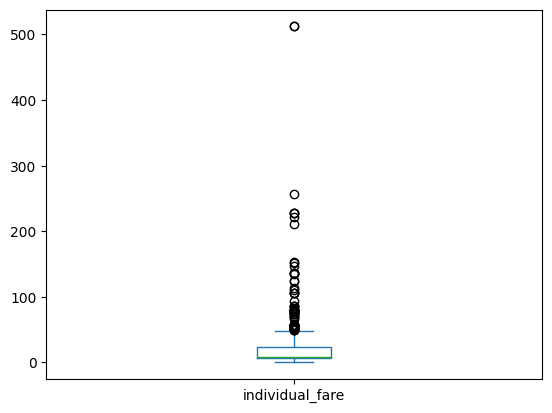

In [69]:
df['individual_fare'].plot(kind='box')

In [70]:
df[['individual_fare','Fare']].describe()

,individual_fare,Fare
count,891.000000,891.000000
mean,19.916375,32.204208
std,35.841257,49.693429
min,0.000000,0.000000
25%,7.250000,7.910400
50%,8.300000,14.454200
75%,23.666667,31.000000
max,512.329200,512.329200


## feature engineering on sibsp and parchil

In [71]:
df['family_size']=df['SibSp']+df['Parch']+1
df

,PassengerId,Survived,Pclass,Name,Sex,Age,SibSp,Parch,Ticket,Fare,Cabin,Embarked,individual_fare,family_size
0,1,0,3,"Braund, Mr. Owen Harris",male,22.0,1,0,A/5 21171,7.2500,NaN,S,3.62500,2
1,2,1,1,"Cumings, Mrs. John Bradley (Florence Briggs Th...",female,38.0,1,0,PC 17599,71.2833,C85,C,35.64165,2
2,3,1,3,"Heikkinen, Miss. Laina",female,26.0,0,0,STON/O2. 3101282,7.9250,NaN,S,7.92500,1
3,4,1,1,"Futrelle, Mrs. Jacques Heath (Lily May Peel)",female,35.0,1,0,113803,53.1000,C123,S,26.55000,2
4,5,0,3,"Allen, Mr. William Henry",male,35.0,0,0,373450,8.0500,NaN,S,8.05000,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
886,887,0,2,"Montvila, Rev. Juozas",male,27.0,0,0,211536,13.0000,NaN,S,13.00000,1
887,888,1,1,"Graham, Miss. Margaret Edith",female,19.0,0,0,112053,30.0000,B42,S,30.00000,1
888,889,0,3,"Johnston, Miss. Catherine Helen ""Carrie""",female,NaN,1,2,W./C. 6607,23.4500,NaN,S,5.86250,4
889,890,1,1,"Behr, Mr. Karl Howell",male,26.0,0,0,111369,30.0000,C148,C,30.00000,1


In [72]:
## I create a new column named family_type

## 1 -> alone

## 2-4 -> small family

## >4 -> large family


def transform_family_size(num):

    if num==1:
        return 'alone'
    
    elif num>=2 and num<=4:
        return 'small'
    else:
        return 'large'

In [73]:
df['family_type']=df['family_size'].apply(transform_family_size)
df

,PassengerId,Survived,Pclass,Name,Sex,Age,SibSp,Parch,Ticket,Fare,Cabin,Embarked,individual_fare,family_size,family_type
0,1,0,3,"Braund, Mr. Owen Harris",male,22.0,1,0,A/5 21171,7.2500,NaN,S,3.62500,2,small
1,2,1,1,"Cumings, Mrs. John Bradley (Florence Briggs Th...",female,38.0,1,0,PC 17599,71.2833,C85,C,35.64165,2,small
2,3,1,3,"Heikkinen, Miss. Laina",female,26.0,0,0,STON/O2. 3101282,7.9250,NaN,S,7.92500,1,alone
3,4,1,1,"Futrelle, Mrs. Jacques Heath (Lily May Peel)",female,35.0,1,0,113803,53.1000,C123,S,26.55000,2,small
4,5,0,3,"Allen, Mr. William Henry",male,35.0,0,0,373450,8.0500,NaN,S,8.05000,1,alone
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
886,887,0,2,"Montvila, Rev. Juozas",male,27.0,0,0,211536,13.0000,NaN,S,13.00000,1,alone
887,888,1,1,"Graham, Miss. Margaret Edith",female,19.0,0,0,112053,30.0000,B42,S,30.00000,1,alone
888,889,0,3,"Johnston, Miss. Catherine Helen ""Carrie""",female,NaN,1,2,W./C. 6607,23.4500,NaN,S,5.86250,4,small
889,890,1,1,"Behr, Mr. Karl Howell",male,26.0,0,0,111369,30.0000,C148,C,30.00000,1,alone


In [74]:
pd.crosstab(df['Survived'],df['family_type'],normalize='columns')*100

family_type,alone,large,small
Survived,,,
0,69.646182,83.870968,42.123288
1,30.353818,16.129032,57.876712


In [75]:
## if you are in a small family,you have high chances of survival

In [76]:
df['surname']=df['Name'].str.split(',').map(lambda x:x[0])
df['surname'].value_counts()

surname
Andersson    9
Sage         7
Panula       6
Skoog        6
Carter       6
            ..
Hanna        1
Lewy         1
Mineff       1
Haas         1
Dooley       1
Name: count, Length: 667, dtype: int64

In [77]:
## we want to extract Mr, Mrs

df['title']=df['Name'].str.split(',').str.get(1).str.strip().str.split(' ').str.get(0)
df['title'].value_counts()

title
Mr.          517
Miss.        182
Mrs.         125
Master.       40
Dr.            7
Rev.           6
Mlle.          2
Major.         2
Col.           2
the            1
Capt.          1
Ms.            1
Sir.           1
Lady.          1
Mme.           1
Don.           1
Jonkheer.      1
Name: count, dtype: int64

In [78]:
df['title']=df['title'].str.replace('Rev.','Mr.')
df['title']=df['title'].str.replace('Jonkheer.','Mr.')
df['title']=df['title'].str.replace('Don.','Mr.')
df['title']=df['title'].str.replace('Sir.','Mr.')
df['title']=df['title'].str.replace('Capt.','Mr.')
df['title']=df['title'].str.replace('Col.','Mr.')
df['title']=df['title'].str.replace('Major.','Mr.')
df['title']=df['title'].str.replace('Rev.','Mr.')
df['title']=df['title'].str.replace('Dr.','Mr.')
df['title']=df['title'].str.replace('other','Mr.')
df['title']=df['title'].str.replace('the','Mr.')
df['title']=df['title'].str.replace('Miss.','Mrs.')
df['title']=df['title'].str.replace('Mme.','Mrs.')
df['title']=df['title'].str.replace('Mlle.','Mrs.')
df['title']=df['title'].str.replace('Ms.','Mrs.')
df['title']=df['title'].str.replace('Lady.','Mrs.')

In [79]:
df['title'].value_counts()

title
Mr.        539
Mrs.       312
Master.     40
Name: count, dtype: int64

In [80]:
pd.crosstab(df['Survived'],df['title'],normalize='columns')*100

title,Master.,Mr.,Mrs.
Survived,,,
0,42.5,83.673469,25.961538
1,57.5,16.326531,74.038462


In [81]:
df['Cabin'].isnull().sum()/len(df['Cabin'])

## we are not dropping this col as this has some useful info

np.float64(0.7710437710437711)

In [82]:
df['Cabin'].value_counts()

## from first letter of cabin we can find the deck information

Cabin
B96 B98        4
G6             4
C23 C25 C27    4
C22 C26        3
F33            3
              ..
E34            1
C7             1
C54            1
E36            1
C148           1
Name: count, Length: 147, dtype: int64

In [83]:
df['Cabin'].fillna('M',inplace=True)

/var/folders/gg/f1jqwyw902s1lt078gd0wfdm0000gn/T/ipykernel_82431/3032343573.py:1: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  df['Cabin'].fillna('M',inplace=True)


In [84]:
df['Cabin'].value_counts()

Cabin
M              687
C23 C25 C27      4
G6               4
B96 B98          4
C22 C26          3
              ... 
E34              1
C7               1
C54              1
E36              1
C148             1
Name: count, Length: 148, dtype: int64

In [85]:
df['deck']=df['Cabin'].str[0]
df['deck'].value_counts()

deck
M    687
C     59
B     47
D     33
E     32
A     15
F     13
G      4
T      1
Name: count, dtype: int64

In [86]:
pd.crosstab(df['deck'],df['Pclass'],normalize='columns')*100

Pclass,1,2,3
deck,,,
A,6.944444,0.000000,0.000000
B,21.759259,0.000000,0.000000
C,27.314815,0.000000,0.000000
D,13.425926,2.173913,0.000000
E,11.574074,2.173913,0.610998
F,0.000000,4.347826,1.018330
G,0.000000,0.000000,0.814664
M,18.518519,91.304348,97.556008
T,0.462963,0.000000,0.000000


In [87]:
## Deck A, B and C are reserved for 1st class passengers

In [88]:
## Deck A,B,C are similar
## Deck D,E are similar
## Deck F,G,M,T are all different

In [89]:
pd.crosstab(df['Survived'],df['deck'],normalize='columns')*100

deck,A,B,C,D,E,F,G,M,T
Survived,,,,,,,,,
0,53.333333,25.531915,40.677966,24.242424,25.0,38.461538,50.0,70.014556,100.0
1,46.666667,74.468085,59.322034,75.757576,75.0,61.538462,50.0,29.985444,0.0


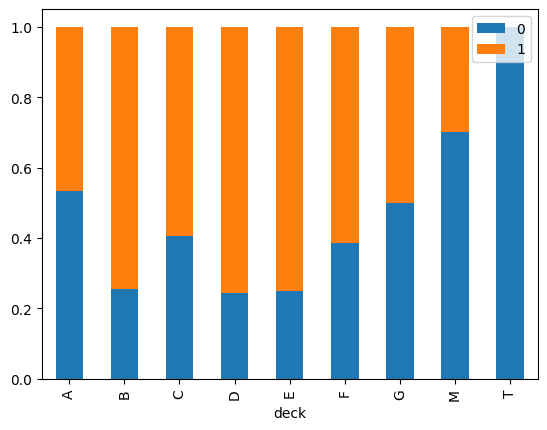

In [90]:
pd.crosstab(df['deck'],df['Survived'],normalize='index').plot(kind='bar',stacked=True)
plt.legend()

## Bivariate Analysis

## 1.Scatter Plot (Numerical-Numerical)

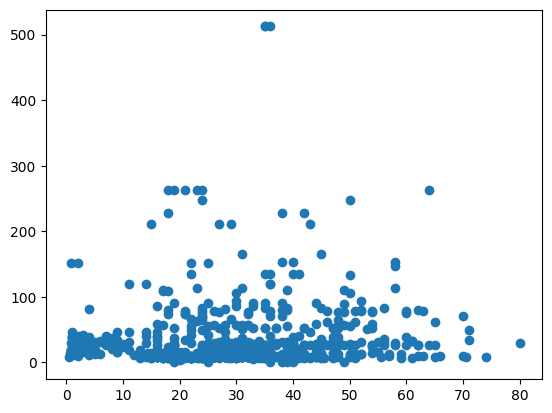

In [91]:
plt.scatter(df['Age'],df['Fare'])

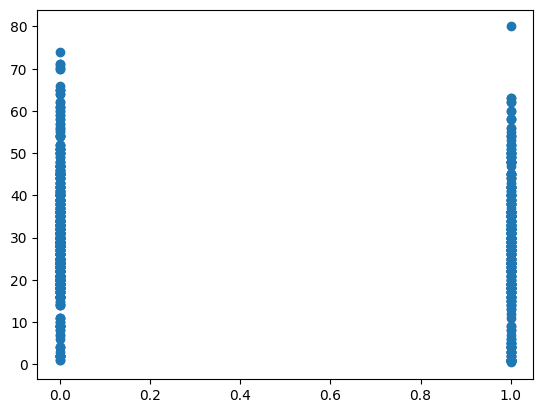

In [92]:
plt.scatter(df['Survived'],df['Age'])

## Barplot (Numerical-Categorical)

<Axes: xlabel='Pclass', ylabel='Fare'>

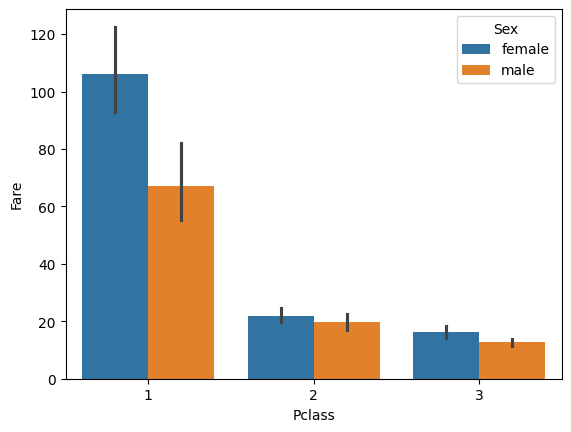

In [93]:
sns.barplot(data=df,x='Pclass',y='Fare',hue='Sex')

<Axes: xlabel='Pclass', ylabel='Age'>

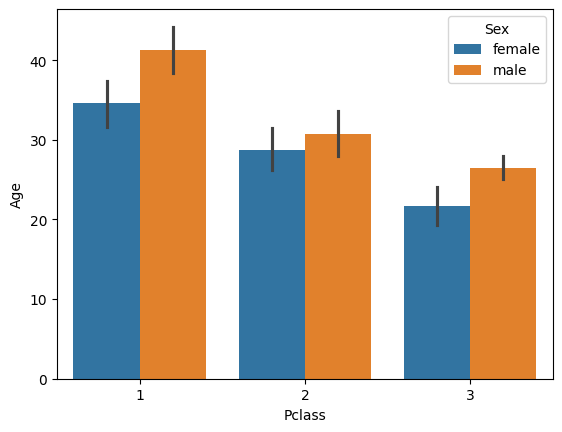

In [94]:
sns.barplot(data=df,x='Pclass',y='Age',hue='Sex')

<Axes: xlabel='Age', ylabel='Fare'>

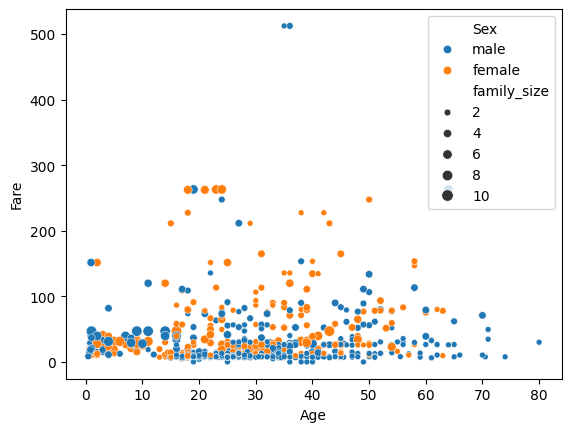

In [95]:
sns.scatterplot(data=df,x='Age',y='Fare',hue='Sex',size='family_size')

## Boxplot (Numerical-Categorical)

<Axes: xlabel='Sex', ylabel='Age'>

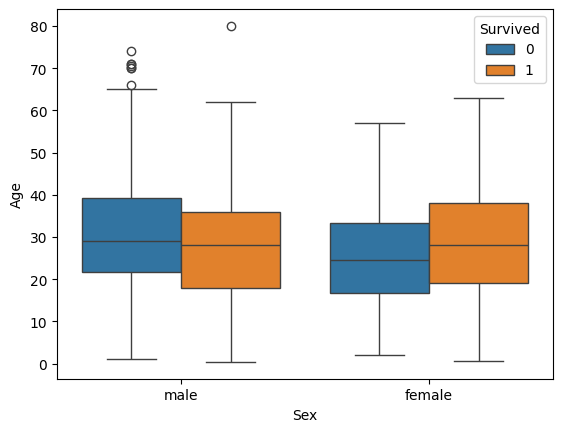

In [96]:
sns.boxplot(data=df,x='Sex',y='Age',hue='Survived')

## Distplot (Numerical-Categorical)

/var/folders/gg/f1jqwyw902s1lt078gd0wfdm0000gn/T/ipykernel_82431/455601345.py:1: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(df[df['Survived']==0]['Age'],hist=False)
/var/folders/gg/f1jqwyw902s1lt078gd0wfdm0000gn/T/ipykernel_82431/455601345.py:2: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

<Axes: xlabel='Age', ylabel='Density'>

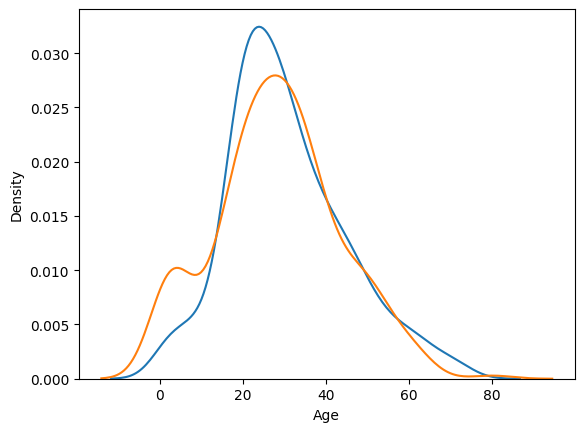

In [97]:
sns.distplot(df[df['Survived']==0]['Age'],hist=False)
sns.distplot(df[df['Survived']==1]['Age'],hist=False)

## Heatmap (Categorical-Categorical)

<Axes: xlabel='Pclass', ylabel='Survived'>

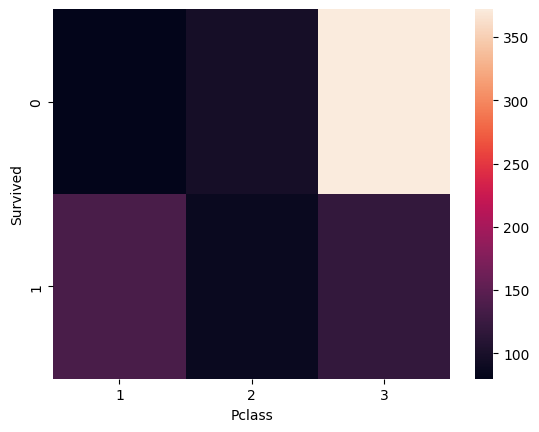

In [98]:
sns.heatmap(pd.crosstab(df['Survived'],df['Pclass']))

In [99]:
df.groupby('Pclass')['Survived'].mean()*100

Pclass
1    62.962963
2    47.282609
3    24.236253
Name: Survived, dtype: float64

## ClusterMap(Categorical- Categorical)

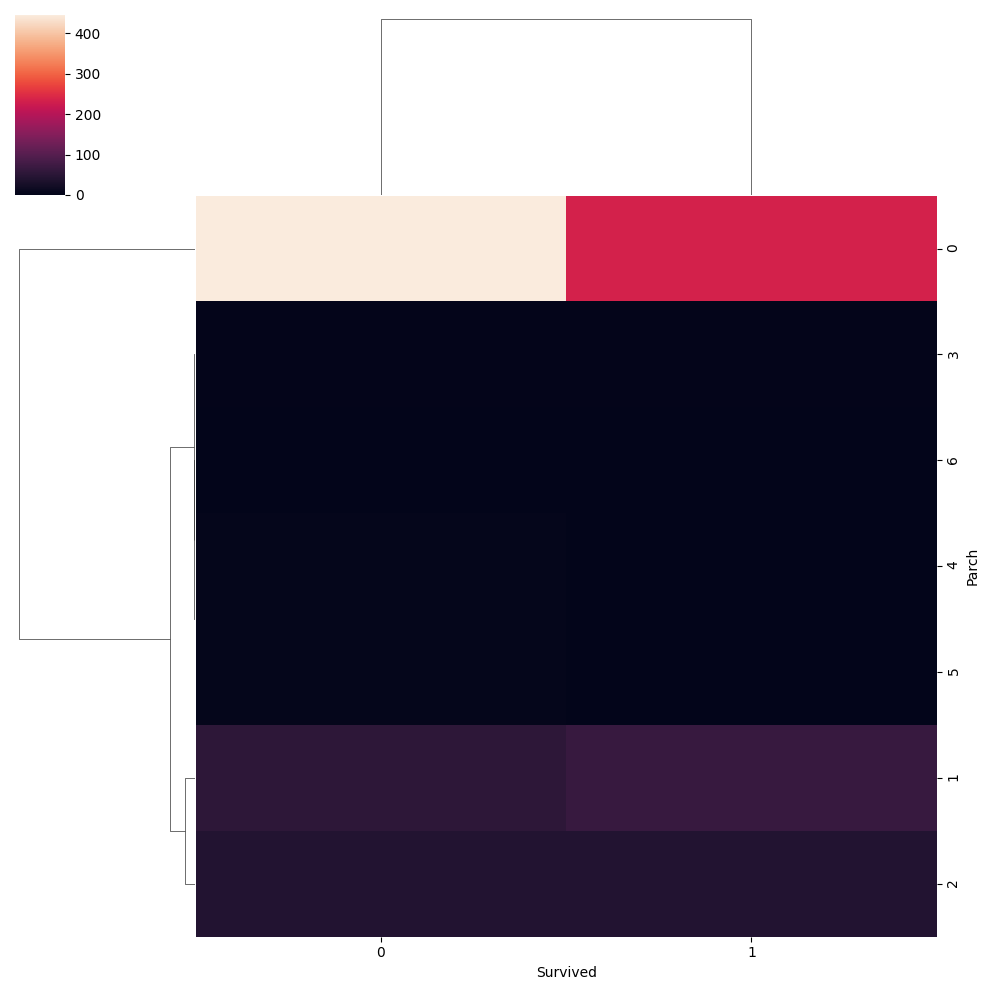

In [100]:
sns.clustermap(pd.crosstab(df['Parch'],df['Survived']))

## dendograms capture hierarchical relationship
## konse values ek dusre se closer hai

## Step 4: Multivariate Analysis

In [101]:
df[['Survived','Age','Fare','family_size']].corr()

,Survived,Age,Fare,family_size
Survived,1.000000,-0.077221,0.257307,0.016639
Age,-0.077221,1.000000,0.096067,-0.301914
Fare,0.257307,0.096067,1.000000,0.217138
family_size,0.016639,-0.301914,0.217138,1.000000


In [102]:
df_new=df.drop(columns=['Name','title','deck','surname','family_type','Embarked','Cabin','Ticket','Sex','Name'])
df_new.corr()['Survived']

PassengerId       -0.005007
Survived           1.000000
Pclass            -0.338481
Age               -0.077221
SibSp             -0.035322
Parch              0.081629
Fare               0.257307
individual_fare    0.221600
family_size        0.016639
Name: Survived, dtype: float64

<Axes: >

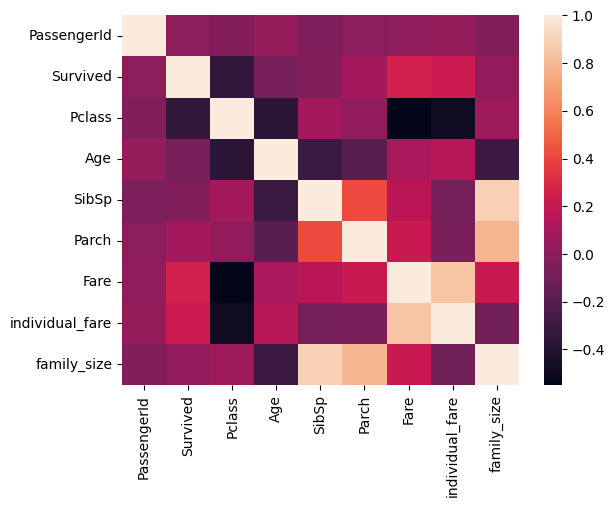

In [103]:
sns.heatmap(df_new.corr())

## Pairplot

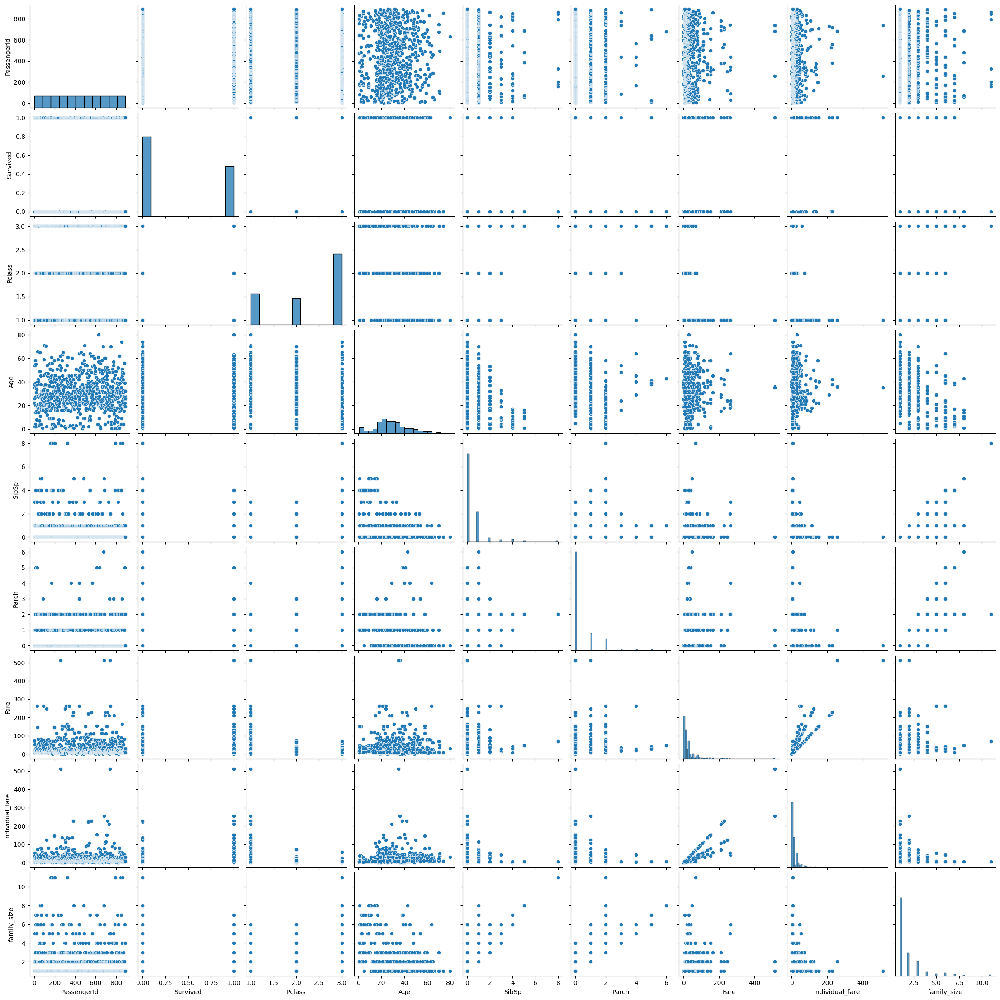

In [104]:
sns.pairplot(df)

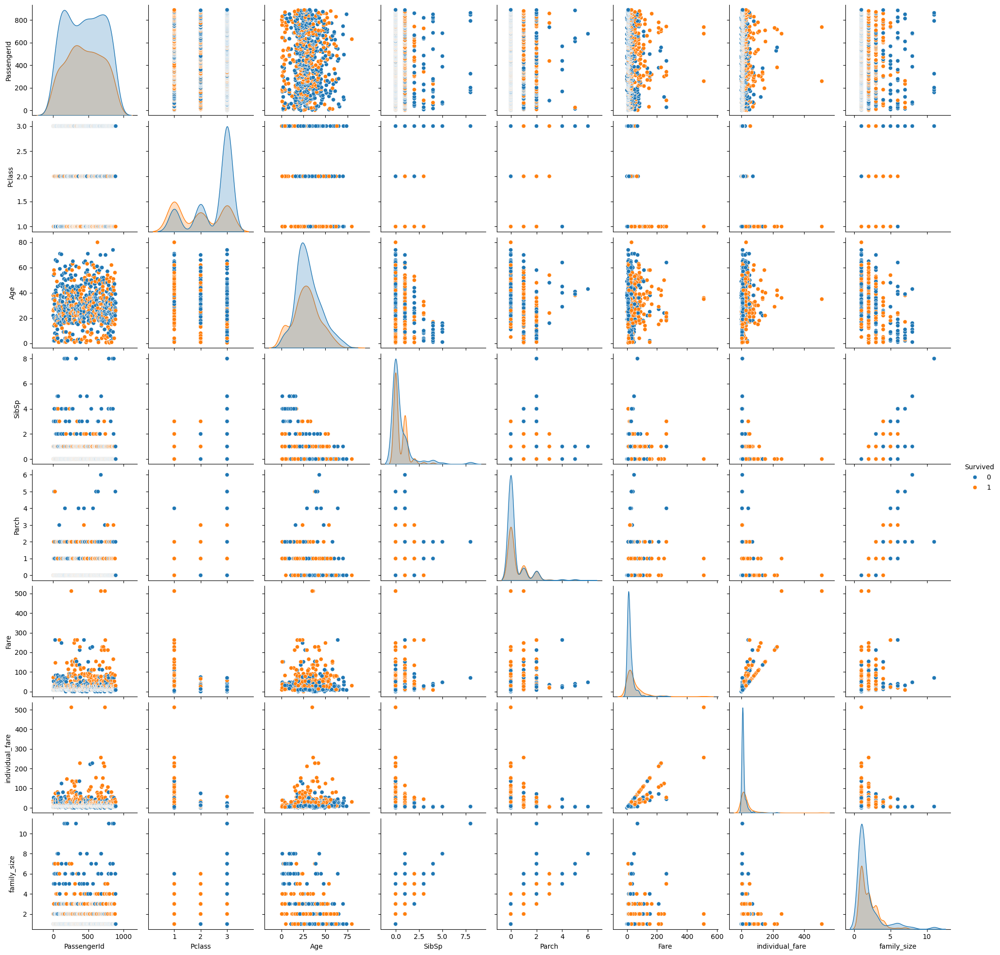

In [105]:
sns.pairplot(df,hue='Survived')

## ydata-Profiling

In [106]:
!pip install ydata-profiling

In [107]:
from ydata_profiling import ProfileReport
prof=ProfileReport(df)
prof.to_file(output_file='output.html')

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

100%|██████████| 18/18 [00:00<00:00, 738.80it/s]


Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

Export report to file:   0%|          | 0/1 [00:00<?, ?it/s]

In [108]:
import webbrowser
webbrowser.open("output.html")

True